In [1]:
!pip install ultralytics
# pip install -U albumentations


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 921.5/921.5 kB 14.8 MB/s eta 0:00:00a 0:00:01


In [4]:
# !mkdir -p /kaggle/working/yolov11l/keras/default/1
# !wget https://github.com/ultralytics/assets/releases/download/v8.3.0/yolo11m.pt -O /kaggle/working/yolov11l/keras/default/1/yolo11m.pt
# from ultralytics import YOLO
model_path1 = '/kaggle/input/yolov8-small/pytorch/default/1/YOLOv11-small_crops.pt'

model_path2 = "/kaggle/input/yolo12s/keras/default/1/yolo12s.pt"


In [11]:
import os
import cv2
import numpy as np
import pandas as pd
import shutil
import yaml
import torch
import random
from ultralytics import YOLO
import random
import matplotlib.pyplot as plt
from PIL import Image

# =============================================================================
# PART 0: Setup and GPU Check
# =============================================================================
torch.cuda.empty_cache()
if torch.cuda.is_available():
    print("GPU is available:", torch.cuda.get_device_name(0))
else:
    print("GPU not available. Running on CPU.")

GPU is available: Tesla T4


In [7]:
# =============================================================================
# PART 0: Set Up Directories and File Paths
# =============================================================================

# Input directories for images & annotations (original and masks)
TRAIN_IMG_INPUT = "/kaggle/input/weed-dataset/train/"
TEST_IMG_INPUT  = "/kaggle/input/weed-dataset/test/"
TRAIN_CSV = "/kaggle/input/weed-dataset/train/_annotations.csv"
TEST_CSV  = "/kaggle/input/weed-dataset/test/_annotations.csv"

TRAIN_IMG_INPUT_MASK = "/kaggle/input/weed-dataset-preprocessed/weed_dataset_preprocessed/train/"
TEST_IMG_INPUT_MASK  = "/kaggle/input/weed-dataset-preprocessed/weed_dataset_preprocessed/test/"

# Working directories for formatted YOLO dataset
WORK_DIR = "/kaggle/working/weed-dataset/"
os.makedirs(os.path.join(WORK_DIR, "train"), exist_ok=True)
os.makedirs(os.path.join(WORK_DIR, "test"), exist_ok=True)

TRAIN_IMG_OUT = os.path.join(WORK_DIR, "train", "images")
TRAIN_LABELS_OUT = os.path.join(WORK_DIR, "train", "labels")
TEST_IMG_OUT  = os.path.join(WORK_DIR, "test", "images")
TEST_LABELS_OUT = os.path.join(WORK_DIR, "test", "labels")

os.makedirs(TRAIN_IMG_OUT, exist_ok=True)
os.makedirs(TRAIN_LABELS_OUT, exist_ok=True)
os.makedirs(TEST_IMG_OUT, exist_ok=True)
os.makedirs(TEST_LABELS_OUT, exist_ok=True)

In [8]:
# =============================================================================
# PART 1: Process Images with Mask Extraction
# =============================================================================
import os
import cv2
import numpy as np
import pandas as pd

def process_and_copy_images(src_img_dir, src_mask_dir, dst_img_dir, csv_file, use_dilation=True):
    """
    For each image in the CSV file, this function reads the original image and its corresponding mask,
    thresholds the mask to create a binary mask, optionally applies dilation, then sets all pixels
    where the (dilated) mask is zero to black in the original image. Finally, it saves the processed
    image to the destination directory.
    """
    df = pd.read_csv(csv_file)
    unique_files = df['filename'].unique()
    
    # Define a 5x5 kernel for dilation
    kernel = np.ones((5, 5), np.uint8)
    
    processed_count = 0
    for filename in unique_files:
        src_img_path = os.path.join(src_img_dir, filename)
        src_mask_path = os.path.join(src_mask_dir, filename)
        dst_img_path = os.path.join(dst_img_dir, filename)

        if not os.path.exists(src_img_path) or not os.path.exists(src_mask_path):
            print(f"Skipping {filename}: missing image or mask.")
            continue

        ori_img = cv2.imread(src_img_path)
        mask = cv2.imread(src_mask_path, cv2.IMREAD_GRAYSCALE)
        if ori_img is None or mask is None:
            print(f"Skipping {filename}: could not read image or mask.")
            continue

        # Threshold the mask to create a binary mask.
        # This assumes that the region of interest (ROI) should be white (255) and background black (0).
        _, binary_mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)

        # Optionally apply dilation to expand the white region
        if use_dilation:
            dilated_mask = cv2.dilate(binary_mask, kernel, iterations=1)
        else:
            dilated_mask = binary_mask

        # Apply the mask: set pixels where the mask equals 0 to black.
        extracted_img = ori_img.copy()
        extracted_img[dilated_mask == 0] = [0, 0, 0]

        cv2.imwrite(dst_img_path, extracted_img)
        processed_count += 1

    print(f"Processed and copied {processed_count} images.")
    return processed_count

# Process training and test images with the corresponding masks
train_img_count = process_and_copy_images(TRAIN_IMG_INPUT, TRAIN_IMG_INPUT_MASK, TRAIN_IMG_OUT, TRAIN_CSV, use_dilation = True)
test_img_count = process_and_copy_images(TEST_IMG_INPUT, TEST_IMG_INPUT_MASK, TEST_IMG_OUT, TEST_CSV , use_dilation = True)

print(f"Processed and copied {train_img_count} training images and {test_img_count} test images with masks applied.")

Processed and copied 2872 images.
Processed and copied 500 images.
Processed and copied 2872 training images and 500 test images with masks applied.


In [ ]:
# # =============================================================================
# # PART 2: Optionally Select a Subset of Files and Annotations
# # =============================================================================

# def select_subset_files(src_img_dir, dst_img_dir, src_csv_file, dst_csv_file, fraction=1.0):
#     """
#     Selects a subset of images and their annotations.
    
#     Parameters:
#       - src_img_dir: Source directory for images.
#       - dst_img_dir: Destination directory for images.
#       - src_csv_file: Source CSV file with annotations.
#       - dst_csv_file: Destination CSV file to store selected annotations.
#       - fraction: Fraction of the data to select (1.0 means all data).
#     """
#     df = pd.read_csv(src_csv_file)
#     df_subset = df.sample(frac=fraction, random_state=42)
#     df_subset.to_csv(dst_csv_file, index=False)
#     selected_files = df_subset['filename'].unique()
#     for filename in selected_files:
#         src_img_path = os.path.join(src_img_dir, filename)
#         dst_img_path = os.path.join(dst_img_dir, filename)
#         # Skip copying if the source and destination are the same file
#         if os.path.abspath(src_img_path) == os.path.abspath(dst_img_path):
#             continue
#         if os.path.exists(src_img_path):
#             shutil.copy(src_img_path, dst_img_path)
#     return len(selected_files)


# # Here we create new CSV files for train/test if you wish to select a subset.
# train_subset_csv = os.path.join(WORK_DIR, "train", "_annotations.csv")
# test_subset_csv = os.path.join(WORK_DIR, "test", "_annotations.csv")

# train_subset_count = select_subset_files(TRAIN_IMG_OUT, TRAIN_IMG_OUT, TRAIN_CSV, train_subset_csv, fraction=1.0)
# test_subset_count = select_subset_files(TEST_IMG_OUT, TEST_IMG_OUT, TEST_CSV, test_subset_csv, fraction=1.0)


In [9]:
# =============================================================================
# PART 2: Convert CSV Annotations to YOLO Bounding Box Format
# =============================================================================

def convert_csv_to_yolo_bbox(csv_file, images_dir, labels_dir):
    """
    Converts CSV annotations to YOLO format bounding boxes:
      <class_id> <x_center> <y_center> <bbox_width> <bbox_height>
      
    Parameters:
      - csv_file: CSV file containing annotations.
      - images_dir: Directory with images (to get image dimensions).
      - labels_dir: Directory to save YOLO annotation files.
    """
    df = pd.read_csv(csv_file)
    groups = df.groupby("filename")
    for filename, group in groups:
        img_path = os.path.join(images_dir, filename)
        if not os.path.exists(img_path):
            continue
        img = cv2.imread(img_path)
        if img is None:
            continue
        h, w = img.shape[:2]
        label_lines = []
        for _, row in group.iterrows():
            cls_id = 0  # single class ("weed")
            xmin, ymin, xmax, ymax = float(row["xmin"]), float(row["ymin"]), float(row["xmax"]), float(row["ymax"])
            x_center = ((xmin + xmax) / 2) / w
            y_center = ((ymin + ymax) / 2) / h
            bbox_w = (xmax - xmin) / w
            bbox_h = (ymax - ymin) / h
            line = f"{cls_id} {x_center:.6f} {y_center:.6f} {bbox_w:.6f} {bbox_h:.6f}"
            label_lines.append(line)
        label_filename = os.path.splitext(filename)[0] + ".txt"
        with open(os.path.join(labels_dir, label_filename), "w") as f:
            f.write("\n".join(label_lines))

# Convert annotations for training and testing sets
convert_csv_to_yolo_bbox(TRAIN_CSV, TRAIN_IMG_OUT, TRAIN_LABELS_OUT)
convert_csv_to_yolo_bbox(TEST_CSV, TEST_IMG_OUT, TEST_LABELS_OUT)
print("Converted CSV annotations to YOLO bounding box format.")

Converted CSV annotations to YOLO bounding box format.


In [10]:
# =============================================================================
# PART 3: Create Dataset YAML File for YOLO Training
# =============================================================================

weed_dataset_yaml = {
    "train": os.path.join(WORK_DIR, "train", "images"),
    "val": os.path.join(WORK_DIR, "test", "images"),
    "nc": 1,
    "names": ["weed"]
}

weed_yaml_file = os.path.join(WORK_DIR, "weed_bbox.yaml")
with open(weed_yaml_file, "w") as f:
    yaml.dump(weed_dataset_yaml, f)
print("Weed dataset YAML created:", weed_dataset_yaml)

Weed dataset YAML created: {'train': '/kaggle/working/weed-dataset/train/images', 'val': '/kaggle/working/weed-dataset/test/images', 'nc': 1, 'names': ['weed']}


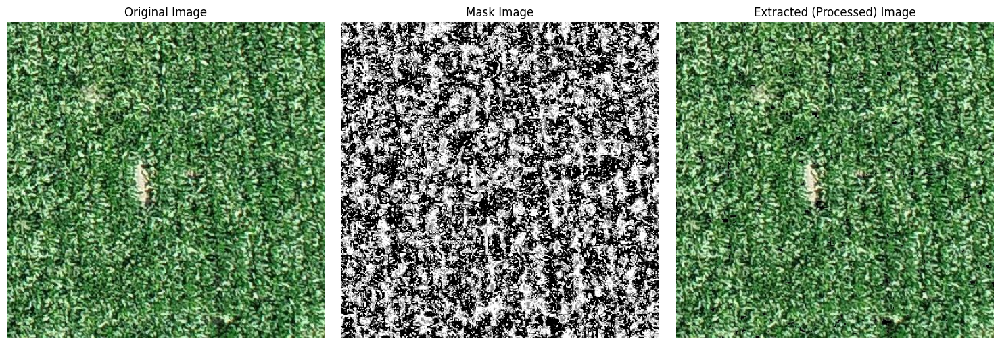

In [12]:
# Directories
original_dir = TRAIN_IMG_INPUT    
mask_dir = TRAIN_IMG_INPUT_MASK         
processed_dir = TRAIN_IMG_OUT          

# Get list of image files from the processed directory
image_files = [f for f in os.listdir(processed_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

if image_files:
    filename = random.choice(image_files)
    orig_path = os.path.join(original_dir, filename)
    mask_path = os.path.join(mask_dir, filename)
    processed_path = os.path.join(processed_dir, filename)
    
    original_img = cv2.imread(orig_path)
    mask_img = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # assuming mask is grayscale
    processed_img = cv2.imread(processed_path)
    
    # Convert original and processed images from BGR to RGB for correct color display
    original_rgb = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
    processed_rgb = cv2.cvtColor(processed_img, cv2.COLOR_BGR2RGB)
    
    # Plot all three images side by side
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.imshow(original_rgb)
    plt.title("Original Image")
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.imshow(mask_img, cmap='gray')
    plt.title("Mask Image")
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    plt.imshow(processed_rgb)
    plt.title("Extracted (Processed) Image")
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
else:
    print("No image files found in the processed directory.")

In [13]:
# =============================================================================
# PART 4-11s: Fine-Tune YOLOv11s for Bounding Box Detection
# =============================================================================

finetune_model = YOLO(model_path1, task="detect")  # Load model for detection

finetune_model.train(
    data=weed_yaml_file, 
    epochs=80,
    imgsz=416,
    batch=16,
    box=8.4,    
    cls=0.5,   
    dfl=1.5,   
    iou=0.5, 
    mosaic=0.3,
    mixup=0.3,
    flipud=0.2,
    warmup_bias_lr=0.08,
    weight_decay=0.001,
    patience=15,
    warmup_epochs=5,     
    warmup_momentum=0.8,
    cos_lr=True,         
    amp=True,
    cache='disk',
)
print("Fine-tuning on weed dataset completed.")


Ultralytics 8.3.78 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=/kaggle/input/yolov8-small/pytorch/default/1/YOLOv11-small_crops.pt, data=/kaggle/working/weed-dataset/weed_bbox.yaml, epochs=80, time=None, patience=15, batch=16, imgsz=416, save=True, save_period=-1, cache=disk, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.5, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_co

100%|██████████| 755k/755k [00:00<00:00, 17.9MB/s]


Overriding model.yaml nc=2 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics.

100%|██████████| 5.35M/5.35M [00:00<00:00, 75.5MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/weed-dataset/train/labels... 2872 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2872/2872 [00:02<00:00, 1208.55it/s]


train: New cache created: /kaggle/working/weed-dataset/train/labels.cache


train: Caching images (1.4GB Disk): 100%|██████████| 2872/2872 [00:03<00:00, 900.17it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.4 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /kaggle/working/weed-dataset/test/labels... 500 images, 0 backgrounds, 0 corrupt: 100%|██████████| 500/500 [00:00<00:00, 1364.58it/s]

val: New cache created: /kaggle/working/weed-dataset/test/labels.cache



val: Caching images (0.2GB Disk): 100%|██████████| 500/500 [00:00<00:00, 719.37it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 54 weight(decay=0.0), 57 weight(decay=0.001), 56 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 416 train, 416 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 80 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/80     0.916G      4.051      3.603      2.081         17        416: 100%|██████████| 180/180 [00:19<00:00,  9.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.84it/s]


                   all        500       1180      0.345      0.372      0.255     0.0683

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/80     0.906G      2.942      2.314      1.504         39        416: 100%|██████████| 180/180 [00:17<00:00, 10.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:02<00:00,  7.96it/s]

                   all        500       1180      0.446      0.434      0.361      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/80     0.902G      2.811      2.145      1.441         15        416: 100%|██████████| 180/180 [00:18<00:00,  9.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.31it/s]

                   all        500       1180        0.5      0.439      0.431       0.12



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/80       0.9G      2.784      2.095      1.427         24        416: 100%|██████████| 180/180 [00:17<00:00, 10.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.23it/s]

                   all        500       1180      0.531      0.506      0.481      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/80     0.902G      2.774      2.064      1.416         28        416: 100%|██████████| 180/180 [00:17<00:00, 10.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.39it/s]

                   all        500       1180      0.448       0.42      0.372      0.094



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/80     0.895G      2.744      2.041      1.414         41        416: 100%|██████████| 180/180 [00:17<00:00, 10.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.03it/s]

                   all        500       1180      0.511      0.496       0.45       0.13



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/80     0.898G      2.745      2.014      1.411         33        416: 100%|██████████| 180/180 [00:16<00:00, 11.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:02<00:00,  7.96it/s]

                   all        500       1180       0.53      0.525      0.474      0.148



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/80     0.914G      2.718      2.056      1.395         25        416: 100%|██████████| 180/180 [00:18<00:00,  9.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:02<00:00,  8.00it/s]

                   all        500       1180       0.53      0.503      0.483       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/80     0.891G      2.704      1.997      1.396         14        416: 100%|██████████| 180/180 [00:18<00:00,  9.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.07it/s]

                   all        500       1180      0.538      0.508      0.491      0.152



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/80     0.891G      2.711      1.958      1.403         22        416: 100%|██████████| 180/180 [00:18<00:00,  9.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.55it/s]


                   all        500       1180      0.569      0.533      0.538      0.177

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/80       0.9G      2.703      1.966      1.403         28        416: 100%|██████████| 180/180 [00:17<00:00, 10.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.11it/s]

                   all        500       1180      0.549      0.552      0.522      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/80     0.893G      2.705      1.968      1.402         41        416: 100%|██████████| 180/180 [00:16<00:00, 10.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.19it/s]

                   all        500       1180      0.502      0.456      0.412      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/80     0.896G      2.696      1.966      1.398         41        416: 100%|██████████| 180/180 [00:16<00:00, 10.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.02it/s]

                   all        500       1180      0.529      0.513      0.497      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/80     0.889G       2.69      1.961      1.396         18        416: 100%|██████████| 180/180 [00:16<00:00, 10.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:02<00:00,  7.81it/s]

                   all        500       1180      0.558      0.541      0.533       0.18



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/80     0.902G      2.687      1.956      1.401         43        416: 100%|██████████| 180/180 [00:16<00:00, 11.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.27it/s]

                   all        500       1180      0.542      0.572      0.519       0.17



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/80     0.893G        2.7      1.927      1.399         28        416: 100%|██████████| 180/180 [00:17<00:00, 10.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.25it/s]

                   all        500       1180      0.533      0.506      0.502       0.16



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/80     0.891G      2.669      1.919       1.39         24        416: 100%|██████████| 180/180 [00:17<00:00, 10.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.32it/s]

                   all        500       1180      0.549      0.582      0.544      0.179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/80     0.896G      2.674       1.93      1.386         41        416: 100%|██████████| 180/180 [00:17<00:00, 10.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.16it/s]

                   all        500       1180      0.607      0.508       0.52      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/80     0.893G      2.675      1.927      1.394         24        416: 100%|██████████| 180/180 [00:18<00:00,  9.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.51it/s]

                   all        500       1180       0.56      0.483       0.49      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/80     0.889G      2.674      1.922      1.392         15        416: 100%|██████████| 180/180 [00:18<00:00,  9.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.28it/s]


                   all        500       1180      0.583      0.563      0.537      0.182

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/80     0.893G      2.658      1.915      1.386         17        416: 100%|██████████| 180/180 [00:17<00:00, 10.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.06it/s]

                   all        500       1180      0.595      0.531       0.52      0.162



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/80     0.889G      2.657      1.879      1.384         30        416: 100%|██████████| 180/180 [00:17<00:00, 10.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:02<00:00,  7.69it/s]

                   all        500       1180      0.591      0.543      0.526      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/80     0.896G      2.684      1.895      1.389         30        416: 100%|██████████| 180/180 [00:17<00:00, 10.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.21it/s]

                   all        500       1180      0.547      0.541      0.523      0.179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/80     0.896G       2.67      1.904      1.382         15        416: 100%|██████████| 180/180 [00:18<00:00,  9.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.28it/s]


                   all        500       1180      0.598      0.547      0.548      0.178

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/80     0.893G      2.674      1.907      1.394         17        416: 100%|██████████| 180/180 [00:17<00:00, 10.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:02<00:00,  7.97it/s]

                   all        500       1180      0.552      0.577      0.542      0.177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/80       0.9G      2.636      1.892      1.377         40        416: 100%|██████████| 180/180 [00:18<00:00,  9.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.36it/s]

                   all        500       1180      0.606      0.523      0.544       0.18



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/80     0.893G      2.628      1.868      1.367         21        416: 100%|██████████| 180/180 [00:17<00:00, 10.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.22it/s]

                   all        500       1180      0.616       0.56      0.566      0.193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/80     0.891G      2.641      1.878      1.378         17        416: 100%|██████████| 180/180 [00:18<00:00,  9.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.24it/s]

                   all        500       1180       0.56      0.518      0.513      0.163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/80     0.924G      2.637      1.869      1.365         22        416: 100%|██████████| 180/180 [00:18<00:00,  9.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.55it/s]

                   all        500       1180      0.578      0.568       0.55      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/80     0.885G      2.651      1.864      1.373         26        416: 100%|██████████| 180/180 [00:17<00:00, 10.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.48it/s]


                   all        500       1180      0.498       0.56      0.499       0.16

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/80     0.885G      2.648      1.843      1.372         54        416: 100%|██████████| 180/180 [00:17<00:00, 10.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.15it/s]

                   all        500       1180      0.606      0.571      0.578      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/80     0.902G      2.653      1.866      1.384         31        416: 100%|██████████| 180/180 [00:18<00:00,  9.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.22it/s]

                   all        500       1180      0.581      0.555      0.549      0.181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/80     0.902G      2.642       1.84      1.375         34        416: 100%|██████████| 180/180 [00:17<00:00, 10.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.17it/s]


                   all        500       1180      0.608      0.559      0.557      0.188

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/80     0.883G      2.647      1.831      1.369         21        416: 100%|██████████| 180/180 [00:17<00:00, 10.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.24it/s]


                   all        500       1180      0.593      0.562      0.555       0.19

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/80     0.883G       2.63      1.824      1.361         21        416: 100%|██████████| 180/180 [00:17<00:00, 10.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.18it/s]


                   all        500       1180      0.611      0.563      0.571      0.196

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/80     0.906G      2.629      1.834      1.379         18        416: 100%|██████████| 180/180 [00:17<00:00, 10.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.39it/s]

                   all        500       1180      0.599      0.581      0.582      0.196



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/80     0.906G      2.623      1.845      1.365         13        416: 100%|██████████| 180/180 [00:18<00:00,  9.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.08it/s]

                   all        500       1180      0.609      0.584      0.599      0.201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/80     0.885G      2.629      1.803      1.358         16        416: 100%|██████████| 180/180 [00:18<00:00,  9.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.37it/s]

                   all        500       1180       0.61      0.571      0.572      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/80     0.904G      2.637      1.814      1.371         24        416: 100%|██████████| 180/180 [00:17<00:00, 10.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.21it/s]

                   all        500       1180      0.599      0.575      0.577        0.2



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/80     0.889G      2.625      1.803      1.365         23        416: 100%|██████████| 180/180 [00:18<00:00,  9.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.57it/s]

                   all        500       1180      0.595      0.575      0.564      0.188



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/80     0.881G       2.61      1.808       1.37         18        416: 100%|██████████| 180/180 [00:17<00:00, 10.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.09it/s]

                   all        500       1180      0.595      0.564      0.575      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/80     0.889G      2.599       1.78      1.358         26        416: 100%|██████████| 180/180 [00:16<00:00, 10.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.39it/s]

                   all        500       1180      0.598      0.548      0.566      0.189



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/80     0.904G      2.612      1.767      1.356         22        416: 100%|██████████| 180/180 [00:16<00:00, 10.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.27it/s]

                   all        500       1180      0.595      0.569       0.57      0.196



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/80     0.896G      2.619      1.778      1.367         21        416: 100%|██████████| 180/180 [00:16<00:00, 10.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.46it/s]

                   all        500       1180      0.556      0.604      0.571      0.184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/80       0.9G      2.597      1.759      1.354         15        416: 100%|██████████| 180/180 [00:17<00:00, 10.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.28it/s]

                   all        500       1180      0.602      0.577      0.591      0.198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/80     0.881G      2.618       1.77      1.361         18        416: 100%|██████████| 180/180 [00:17<00:00, 10.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.29it/s]


                   all        500       1180       0.62      0.582      0.591      0.204

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/80     0.902G      2.594      1.758       1.36         18        416: 100%|██████████| 180/180 [00:16<00:00, 10.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.30it/s]

                   all        500       1180      0.617      0.571      0.583      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/80     0.889G        2.6      1.739      1.362         31        416: 100%|██████████| 180/180 [00:16<00:00, 10.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.23it/s]


                   all        500       1180      0.638      0.564      0.583      0.202

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/80     0.885G      2.598      1.763      1.357         21        416: 100%|██████████| 180/180 [00:16<00:00, 11.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.41it/s]

                   all        500       1180        0.6       0.56      0.573      0.198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/80     0.887G      2.583      1.742      1.344         21        416: 100%|██████████| 180/180 [00:16<00:00, 10.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.53it/s]

                   all        500       1180      0.594      0.586      0.572      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/80     0.887G      2.589      1.758      1.356         12        416: 100%|██████████| 180/180 [00:16<00:00, 10.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:02<00:00,  7.53it/s]

                   all        500       1180      0.583      0.611      0.586      0.202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/80     0.887G      2.593      1.753      1.356         35        416: 100%|██████████| 180/180 [00:16<00:00, 10.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:02<00:00,  7.99it/s]

                   all        500       1180      0.606      0.588      0.588      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/80     0.885G      2.583      1.734      1.351         33        416: 100%|██████████| 180/180 [00:18<00:00,  9.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:02<00:00,  7.95it/s]

                   all        500       1180      0.608       0.61      0.606      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/80     0.881G      2.586      1.729      1.347         36        416: 100%|██████████| 180/180 [00:17<00:00, 10.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.00it/s]

                   all        500       1180        0.6      0.609        0.6       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/80     0.887G      2.597       1.73      1.351         24        416: 100%|██████████| 180/180 [00:18<00:00,  9.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.33it/s]

                   all        500       1180      0.624      0.588      0.596       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/80     0.887G      2.582      1.736      1.354         15        416: 100%|██████████| 180/180 [00:17<00:00, 10.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.34it/s]

                   all        500       1180      0.643      0.542      0.584      0.206



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/80     0.887G      2.586      1.717      1.347         19        416: 100%|██████████| 180/180 [00:17<00:00, 10.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.08it/s]

                   all        500       1180        0.6      0.607       0.59      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/80     0.887G      2.578      1.729      1.354         24        416: 100%|██████████| 180/180 [00:18<00:00,  9.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.35it/s]

                   all        500       1180      0.602       0.62      0.604       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/80       0.9G      2.549      1.721      1.343         26        416: 100%|██████████| 180/180 [00:17<00:00, 10.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.15it/s]


                   all        500       1180      0.584      0.634      0.594      0.202

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/80     0.885G      2.592      1.737      1.364         21        416: 100%|██████████| 180/180 [00:17<00:00, 10.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.37it/s]


                   all        500       1180      0.608      0.602      0.606      0.208

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/80     0.885G      2.575      1.715      1.348         18        416: 100%|██████████| 180/180 [00:17<00:00, 10.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.38it/s]

                   all        500       1180      0.632      0.605      0.619      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/80     0.908G       2.58      1.715      1.353         25        416: 100%|██████████| 180/180 [00:17<00:00, 10.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.39it/s]

                   all        500       1180      0.597      0.612      0.597      0.206



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/80     0.887G      2.568      1.709       1.35         24        416: 100%|██████████| 180/180 [00:17<00:00, 10.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:02<00:00,  8.00it/s]

                   all        500       1180      0.602      0.612      0.601      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/80     0.885G      2.561      1.691      1.343         34        416: 100%|██████████| 180/180 [00:16<00:00, 10.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.29it/s]

                   all        500       1180      0.611      0.619      0.604      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/80      0.91G      2.563      1.704      1.342         20        416: 100%|██████████| 180/180 [00:16<00:00, 10.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.30it/s]

                   all        500       1180      0.608      0.603      0.596      0.206



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/80     0.887G      2.578      1.715      1.351         45        416: 100%|██████████| 180/180 [00:17<00:00, 10.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.23it/s]


                   all        500       1180      0.617      0.611      0.612      0.213

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/80     0.885G      2.568      1.717      1.352         40        416: 100%|██████████| 180/180 [00:16<00:00, 10.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.23it/s]

                   all        500       1180      0.623       0.61      0.612      0.217



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/80     0.887G      2.554      1.698      1.341         20        416: 100%|██████████| 180/180 [00:15<00:00, 11.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.31it/s]

                   all        500       1180      0.606      0.608      0.602      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/80     0.906G      2.561      1.713      1.351         30        416: 100%|██████████| 180/180 [00:17<00:00, 10.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.16it/s]

                   all        500       1180      0.599      0.617      0.601      0.208



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/80     0.885G      2.555      1.695      1.342         37        416: 100%|██████████| 180/180 [00:17<00:00, 10.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.14it/s]

                   all        500       1180      0.618      0.617      0.616      0.213


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      71/80     0.889G      2.408      1.464        1.3         30        416: 100%|██████████| 180/180 [00:16<00:00, 10.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.30it/s]

                   all        500       1180      0.618      0.608      0.608       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      72/80     0.887G      2.424      1.457      1.321         17        416: 100%|██████████| 180/180 [00:15<00:00, 11.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.41it/s]

                   all        500       1180      0.614      0.615       0.61      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      73/80     0.885G      2.423      1.453      1.306         14        416: 100%|██████████| 180/180 [00:15<00:00, 11.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.43it/s]

                   all        500       1180      0.627      0.609      0.612      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      74/80     0.885G      2.428      1.459      1.328         16        416: 100%|██████████| 180/180 [00:15<00:00, 11.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.29it/s]

                   all        500       1180      0.613      0.619      0.607      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      75/80     0.889G      2.429      1.452       1.31         25        416: 100%|██████████| 180/180 [00:15<00:00, 11.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.24it/s]

                   all        500       1180      0.604      0.629       0.61      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      76/80     0.889G      2.427       1.45      1.319         22        416: 100%|██████████| 180/180 [00:16<00:00, 11.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.22it/s]

                   all        500       1180      0.616      0.619      0.611      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      77/80     0.885G      2.412      1.434      1.314         15        416: 100%|██████████| 180/180 [00:15<00:00, 11.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.11it/s]

                   all        500       1180      0.611       0.62      0.611      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      78/80     0.885G      2.436      1.448      1.319         12        416: 100%|██████████| 180/180 [00:15<00:00, 11.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.45it/s]

                   all        500       1180       0.62      0.617       0.61      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      79/80     0.885G      2.433      1.444      1.313         22        416: 100%|██████████| 180/180 [00:15<00:00, 11.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.23it/s]

                   all        500       1180      0.614      0.628      0.615      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      80/80     0.885G      2.419      1.459      1.312         12        416: 100%|██████████| 180/180 [00:16<00:00, 11.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.43it/s]

                   all        500       1180      0.609      0.625      0.612      0.214



80 epochs completed in 0.442 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 3.4MB
Optimizer stripped from runs/detect/train/weights/best.pt, 3.4MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.78 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n_s summary (fused): 67 layers, 1,591,849 parameters, 0 gradients, 4.9 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:02<00:00,  5.81it/s]


                   all        500       1180      0.622       0.61      0.612      0.217


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.1ms preprocess, 0.9ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/train
Fine-tuning on weed dataset completed.


In [ ]:
# =============================================================================
# PART 4-12s: Fine-Tune YOLOv11s for Bounding Box Detection
# =============================================================================

finetune_model = YOLO(model_path2, task="detect")  # Load model for detection

print("Starting fine-tuning on weed dataset with improved config...")
finetune_model.train(
    data=weed_yaml_file, 
    epochs=80,         
    imgsz=640,           
    batch=16,
    box=8.4,            
    cls=0.5,
    dfl=1.5,
    iou=0.5, 
    mosaic=0.2,          
    mixup=0.2,          
    flipud=0.2,
    warmup_bias_lr=0.08,
    weight_decay=0.001,
    patience=15,
    warmup_epochs=3,     
    warmup_momentum=0.8,
    cos_lr=True,
    amp=True,
    cache='disk',
    workers=4,
)

print("Fine-tuning on weed dataset completed.")

Starting fine-tuning on weed dataset with improved config...
Ultralytics 8.3.78 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=/kaggle/input/yolo12s/keras/default/1/yolo12s.pt, data=/kaggle/working/weed-dataset/weed_bbox.yaml, epochs=80, time=None, patience=15, batch=16, imgsz=640, save=True, save_period=-1, cache=disk, device=None, workers=4, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.5, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False,

train: Scanning /kaggle/working/weed-dataset/train/labels.cache... 2872 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2872/2872 [00:00<?, ?it/s]
train: Caching images (1.4GB Disk): 100%|██████████| 2872/2872 [00:00<00:00, 25080.09it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /kaggle/working/weed-dataset/test/labels.cache... 500 images, 0 backgrounds, 0 corrupt: 100%|██████████| 500/500 [00:00<?, ?it/s]
val: Caching images (0.2GB Disk): 100%|██████████| 500/500 [00:00<00:00, 21892.31it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.001), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 80 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/80      8.16G      2.886      3.147      1.894         36        640: 100%|██████████| 180/180 [01:25<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.66it/s]

                   all        500       1180      0.393      0.415      0.335     0.0903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/80      6.45G      2.778      2.427      1.795         27        640: 100%|██████████| 180/180 [01:22<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.58it/s]

                   all        500       1180     0.0928       0.28     0.0536     0.0135



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/80      6.45G      2.766      2.375      1.793         19        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

                   all        500       1180      0.505      0.374      0.342     0.0907



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/80      6.46G      2.717       2.35      1.758         12        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]

                   all        500       1180      0.393       0.39      0.319     0.0943



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/80      6.46G      2.703      2.316      1.745         13        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.65it/s]

                   all        500       1180      0.507      0.515      0.477      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/80      6.46G      2.661      2.241      1.719         30        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.62it/s]

                   all        500       1180      0.504      0.463       0.44      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/80      6.46G       2.67      2.219       1.71         22        640: 100%|██████████| 180/180 [01:20<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.62it/s]

                   all        500       1180      0.523      0.475      0.456       0.14



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/80      6.46G      2.654      2.176      1.689         14        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

                   all        500       1180      0.519      0.465      0.456      0.136



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/80      6.46G      2.633      2.147      1.703         24        640: 100%|██████████| 180/180 [01:20<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

                   all        500       1180      0.564      0.503      0.496      0.147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/80      6.46G      2.632      2.152      1.694         20        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.61it/s]

                   all        500       1180       0.54      0.474      0.478      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/80      6.46G      2.626      2.137      1.704         30        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.62it/s]

                   all        500       1180      0.573      0.529      0.532      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/80      6.49G      2.602      2.173      1.674         19        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.61it/s]

                   all        500       1180      0.575       0.56      0.551      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/80      6.46G      2.605      2.133       1.68         25        640: 100%|██████████| 180/180 [01:20<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.65it/s]

                   all        500       1180      0.568      0.556      0.557      0.182



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/80      6.48G      2.601       2.12      1.684         31        640: 100%|██████████| 180/180 [01:20<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]

                   all        500       1180      0.555      0.527      0.523       0.17



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/80      6.46G      2.578      2.083      1.656         19        640: 100%|██████████| 180/180 [01:20<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

                   all        500       1180      0.597       0.57      0.578      0.198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/80      6.46G      2.589      2.086      1.664         18        640: 100%|██████████| 180/180 [01:20<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.62it/s]

                   all        500       1180      0.575      0.505      0.516      0.168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/80      6.46G      2.595      2.065      1.679         13        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]

                   all        500       1180      0.577       0.57      0.546      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/80      6.47G      2.579      2.056      1.658         33        640: 100%|██████████| 180/180 [01:20<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

                   all        500       1180      0.581      0.575      0.563      0.187



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/80      6.46G      2.586      2.029      1.648         13        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.62it/s]

                   all        500       1180      0.615       0.54      0.564       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/80      6.46G      2.569      2.038      1.646         28        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.65it/s]

                   all        500       1180      0.599       0.56       0.57       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/80      6.46G      2.575      2.027      1.651         24        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]

                   all        500       1180      0.574      0.558      0.531      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/80      6.44G      2.556      2.062      1.651         16        640: 100%|██████████| 180/180 [01:20<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]

                   all        500       1180      0.584      0.544      0.546      0.181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/80      6.46G      2.558      2.022      1.646         27        640: 100%|██████████| 180/180 [01:20<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.61it/s]

                   all        500       1180      0.617      0.548      0.571      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/80      6.49G      2.564      1.975      1.641         29        640: 100%|██████████| 180/180 [01:20<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.65it/s]

                   all        500       1180      0.599       0.55       0.55      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/80      6.46G      2.557      2.006      1.643         32        640: 100%|██████████| 180/180 [01:20<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

                   all        500       1180      0.599      0.534      0.535      0.172



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/80      6.48G      2.552      1.977      1.644         21        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

                   all        500       1180      0.589       0.58      0.586        0.2



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/80      6.46G      2.552       1.99       1.63         20        640: 100%|██████████| 180/180 [01:20<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]

                   all        500       1180      0.631      0.538      0.577      0.202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/80      6.46G      2.555       1.97      1.642         27        640: 100%|██████████| 180/180 [01:20<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

                   all        500       1180      0.529      0.541      0.523      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/80      6.46G      2.536      1.987      1.627         37        640: 100%|██████████| 180/180 [01:20<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.62it/s]

                   all        500       1180       0.59      0.586      0.596      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/80      6.46G      2.551      1.976      1.625         24        640: 100%|██████████| 180/180 [01:20<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.65it/s]

                   all        500       1180      0.638      0.569      0.596      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/80      6.44G      2.519      1.985      1.631         20        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]

                   all        500       1180      0.622      0.583      0.592      0.205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/80      6.46G      2.536      1.963      1.619         25        640: 100%|██████████| 180/180 [01:20<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.62it/s]

                   all        500       1180       0.62      0.579      0.589      0.197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/80      6.46G      2.539      1.924      1.616         20        640: 100%|██████████| 180/180 [01:20<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.65it/s]

                   all        500       1180      0.592       0.58      0.584      0.192



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/80      6.46G      2.519      1.963      1.607         37        640: 100%|██████████| 180/180 [01:20<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.65it/s]

                   all        500       1180      0.593      0.581      0.583      0.196



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/80      6.46G      2.515      1.926      1.604         44        640: 100%|██████████| 180/180 [01:20<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.65it/s]

                   all        500       1180      0.596      0.619      0.613      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/80      6.46G      2.521      1.941      1.624         15        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

                   all        500       1180      0.625      0.587      0.596      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/80      6.46G      2.521      1.931      1.604         13        640: 100%|██████████| 180/180 [01:20<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.65it/s]

                   all        500       1180      0.654      0.581      0.614      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/80      6.46G      2.502      1.875      1.603         11        640: 100%|██████████| 180/180 [01:20<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

                   all        500       1180      0.624      0.592      0.604      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/80      6.46G      2.504       1.88      1.608         19        640: 100%|██████████| 180/180 [01:20<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

                   all        500       1180      0.628      0.603      0.623      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/80      6.46G        2.5      1.887      1.599         22        640: 100%|██████████| 180/180 [01:20<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

                   all        500       1180      0.613        0.6      0.621      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/80      6.49G      2.514      1.908      1.618         23        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.62it/s]

                   all        500       1180      0.623      0.583       0.61      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/80      6.44G      2.504      1.871      1.602         30        640: 100%|██████████| 180/180 [01:21<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]

                   all        500       1180      0.619      0.597      0.598      0.208



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/80      6.44G      2.505      1.851      1.605         22        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.65it/s]

                   all        500       1180      0.623      0.597      0.618      0.217



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/80      6.46G      2.493      1.845       1.59         24        640: 100%|██████████| 180/180 [01:21<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.65it/s]

                   all        500       1180      0.625      0.624      0.617      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/80      6.46G      2.493      1.858      1.592         21        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

                   all        500       1180      0.645      0.585      0.617      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/80      6.44G      2.489      1.852      1.589         21        640: 100%|██████████| 180/180 [01:21<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

                   all        500       1180      0.621      0.635      0.642      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/80      6.44G       2.49      1.839      1.595         20        640: 100%|██████████| 180/180 [01:21<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.65it/s]

                   all        500       1180      0.657      0.568      0.624      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/80      6.46G      2.481      1.823      1.597         25        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

                   all        500       1180      0.623      0.621      0.631      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/80      6.49G      2.471      1.829      1.595         15        640: 100%|██████████| 180/180 [01:20<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.66it/s]

                   all        500       1180      0.627      0.614      0.631      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/80      6.44G      2.486      1.827       1.59         27        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.66it/s]

                   all        500       1180      0.603      0.632       0.64      0.222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/80      6.46G      2.477       1.82      1.585         17        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.65it/s]

                   all        500       1180      0.665      0.581       0.63      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/80      6.46G      2.467      1.819      1.595         16        640: 100%|██████████| 180/180 [01:20<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

                   all        500       1180      0.641      0.594      0.626      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/80      6.46G      2.468      1.795      1.579         20        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.65it/s]

                   all        500       1180      0.657      0.592      0.631      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/80      6.44G      2.462        1.8      1.578         26        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.66it/s]

                   all        500       1180      0.634      0.614      0.631      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/80      6.44G      2.474      1.805      1.582         30        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

                   all        500       1180      0.642      0.609      0.639      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/80      6.44G      2.466      1.778      1.575         18        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.66it/s]

                   all        500       1180      0.646      0.597      0.636      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/80      6.46G      2.455      1.777      1.583         18        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

                   all        500       1180       0.65      0.576      0.625      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/80      6.44G      2.465      1.765       1.58         10        640: 100%|██████████| 180/180 [01:21<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]

                   all        500       1180      0.641      0.595      0.627      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/80      6.44G      2.455       1.77      1.579         17        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.65it/s]

                   all        500       1180      0.642      0.607      0.636      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/80      6.46G      2.456      1.757       1.59         15        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.66it/s]

                   all        500       1180      0.654      0.601      0.642       0.23



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/80      6.49G      2.461      1.745      1.577         41        640: 100%|██████████| 180/180 [01:21<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]

                   all        500       1180      0.656      0.608      0.645      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/80      6.49G      2.462      1.746      1.571         13        640: 100%|██████████| 180/180 [01:21<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]

                   all        500       1180      0.648      0.608      0.639      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/80      6.48G      2.448      1.753      1.574         25        640: 100%|██████████| 180/180 [01:21<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]

                   all        500       1180      0.631      0.612       0.64      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/80      6.46G       2.45      1.758      1.579         16        640: 100%|██████████| 180/180 [01:21<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]

                   all        500       1180      0.644      0.619      0.643       0.23



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/80      6.46G      2.449      1.737      1.575         18        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.65it/s]

                   all        500       1180       0.65      0.619      0.646      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/80      6.46G      2.455      1.763      1.576         24        640: 100%|██████████| 180/180 [01:20<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.65it/s]

                   all        500       1180      0.644      0.612       0.64      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/80      6.46G      2.438      1.744       1.56         27        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.65it/s]

                   all        500       1180      0.635      0.613      0.634      0.229


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      71/80      6.46G      2.363      1.526      1.556         30        640: 100%|██████████| 180/180 [01:21<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.61it/s]

                   all        500       1180       0.66      0.608       0.65      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      72/80      6.46G      2.378      1.512      1.576         17        640: 100%|██████████| 180/180 [01:21<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

                   all        500       1180      0.644      0.618      0.647      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      73/80      6.44G      2.372      1.499      1.557         14        640: 100%|██████████| 180/180 [01:20<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

                   all        500       1180      0.653      0.624      0.651      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      74/80      6.46G      2.364      1.513      1.579         16        640: 100%|██████████| 180/180 [01:20<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.66it/s]

                   all        500       1180      0.651      0.623       0.65      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      75/80      6.46G      2.375      1.506      1.567         25        640: 100%|██████████| 180/180 [01:20<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.67it/s]

                   all        500       1180      0.655      0.627      0.651      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      76/80      6.46G      2.364      1.505      1.569         22        640: 100%|██████████| 180/180 [01:20<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]

                   all        500       1180      0.641      0.638      0.654      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      77/80      6.44G      2.359      1.489      1.568         15        640: 100%|██████████| 180/180 [01:20<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

                   all        500       1180      0.656       0.63      0.653      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      78/80      6.46G      2.374      1.497      1.575         12        640: 100%|██████████| 180/180 [01:20<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]

                   all        500       1180      0.649      0.632      0.652      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      79/80      6.44G      2.385      1.483      1.589         22        640:  16%|█▌        | 28/180 [00:13<01:08,  2.21it/s]

In [29]:
finetune_model_11s_smallweedcrops = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')
finetune_model_12s = YOLO('/kaggle/working/runs/detect/train2/weights/best.pt')

In [25]:
# =============================================================================
# PART 5_11s: Evaluate the Fine-Tuned Model
# =============================================================================

print("Evaluating the fine-tuned model...")
# validation_results = finetune_model.val(data=weed_yaml_file, imgsz=416, device=0, verbose=True)
validation_results=finetune_model_11s_smallweedcrops.val(
    data=weed_yaml_file,  # Path to your dataset configuration
    imgsz=416,         # Image size
    batch=16,          # Batch size
    conf=0.30,         # Lower confidence
    iou=0.55,         # Slightly relaxed IOU
    device=0,
    verbose=True
)
# print("Evaluation results on weed dataset:", eval_results)

print("Validation Metrics on Weed Dataset:")
print(f"mAP50-95: {validation_results.box.map:.4f}")
print(f"mAP50: {validation_results.box.map50:.4f}")
print(f"mAP75: {validation_results.box.map75:.4f}")
print(f"Category-wise mAP: {validation_results.box.maps}")
print(f"Precision: {validation_results.box.p[0]:.4f}")  # Precision of class 0
print(f"Recall: {validation_results.box.r[0]:.4f}")      # Recall of class 0



Evaluating the fine-tuned model...
Ultralytics 8.3.78 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)


val: Scanning /kaggle/working/weed-dataset/test/labels.cache... 500 images, 0 backgrounds, 0 corrupt: 100%|██████████| 500/500 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:02<00:00, 10.94it/s]


                   all        500       1180      0.705      0.509      0.597       0.25


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.1ms preprocess, 1.8ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/detect/val7
Validation Metrics on Weed Dataset:
mAP50-95: 0.2504
mAP50: 0.5973
mAP75: 0.1418
Category-wise mAP: [    0.25037]
Precision: 0.7054
Recall: 0.5093


In [90]:
# =============================================================================
# PART 5_12s: Evaluate the Fine-Tuned Model
# =============================================================================

print("Evaluating the fine-tuned model...")
validation_results=finetune_model_12s.val(
    data=weed_yaml_file,  # Path to your dataset configuration
    imgsz=416,         # Image size
    batch=16,          # Batch size
    conf=0.30,         # Lower confidence
    iou=0.55,         # Slightly relaxed IOU
    device=0,
    verbose=True
)
# print("Evaluation results on weed dataset:", eval_results)

print("Validation Metrics on Weed Dataset:")
print(f"mAP50-95: {validation_results.box.map:.4f}")
print(f"mAP50: {validation_results.box.map50:.4f}")
print(f"mAP75: {validation_results.box.map75:.4f}")
print(f"Category-wise mAP: {validation_results.box.maps}")
print(f"Precision: {validation_results.box.p[0]:.4f}")  # Precision of class 0
print(f"Recall: {validation_results.box.r[0]:.4f}")      # Recall of class 0



Evaluating the fine-tuned model...
Ultralytics 8.3.78 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)


val: Scanning /kaggle/working/weed-dataset/test/labels.cache... 500 images, 0 backgrounds, 0 corrupt: 100%|██████████| 500/500 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:04<00:00,  6.68it/s]


                   all        500       1180      0.712      0.512      0.604      0.248


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.1ms preprocess, 6.1ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/detect/val3
Validation Metrics on Weed Dataset:
mAP50-95: 0.2484
mAP50: 0.6038
mAP75: 0.1223
Category-wise mAP: [    0.24838]
Precision: 0.7123
Recall: 0.5119


In [ ]:
ls /kaggle/working/runs/detect/train

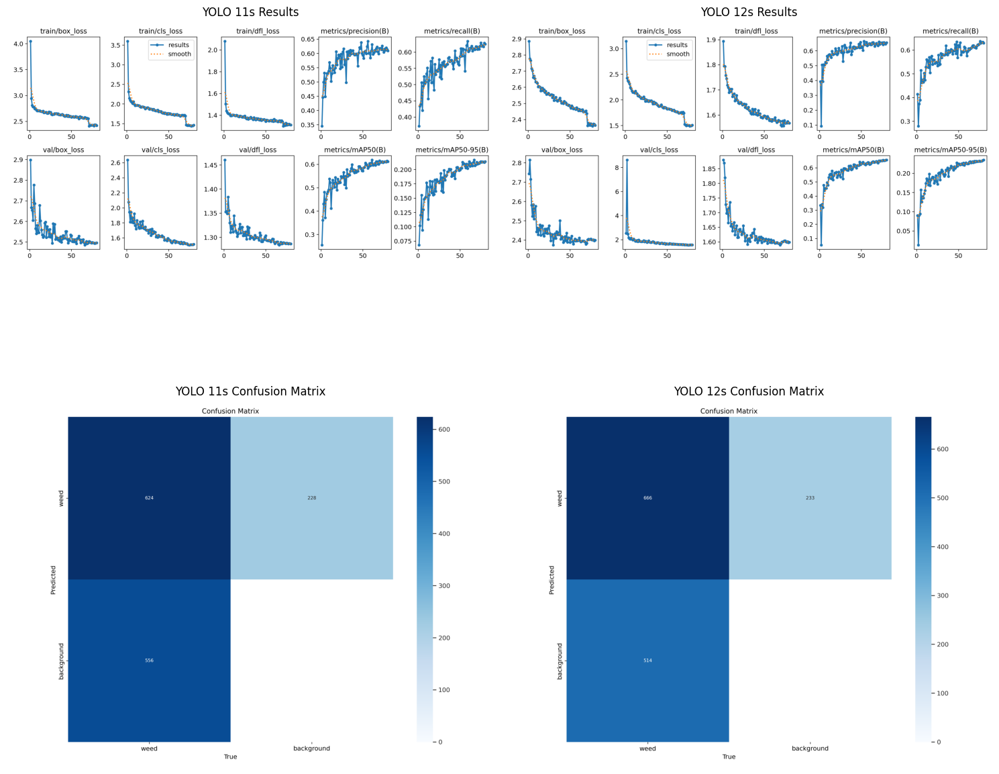

In [92]:
image_paths = [
    "/kaggle/working/runs/detect/train/results.png",  # YOLO 11s results
    "/kaggle/working/runs/detect/train2/results.png",  # YOLO 12s results
    "/kaggle/working/runs/detect/val/confusion_matrix.png",  # YOLO 11s confusion matrix
    "/kaggle/working/runs/detect/val2/confusion_matrix.png"  # YOLO 12s confusion matrix
]

titles = ["YOLO 11s Results", "YOLO 12s Results", "YOLO 11s Confusion Matrix", "YOLO 12s Confusion Matrix"]

fig, axes = plt.subplots(2, 2, figsize=(15, 15))  

axes = axes.flatten()

for ax, img_path, title in zip(axes, image_paths, titles):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.set_title(title)
    ax.axis("off")

plt.tight_layout()
plt.show()


## Predictions Comparison


image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0064_6_4_JPG.rf.96a7cefe56d92d9ce2b6a2702c5222c6.jpg: 416x416 5 weeds, 7.7ms
Speed: 1.1ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0064_6_4_JPG.rf.96a7cefe56d92d9ce2b6a2702c5222c6.jpg: 640x640 5 weeds, 21.1ms
Speed: 2.3ms preprocess, 21.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


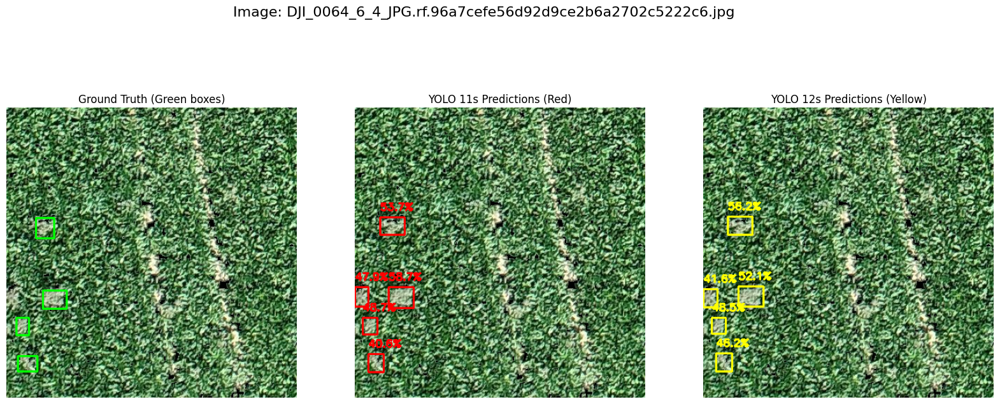


image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0106_6_12_JPG.rf.690aa85ad4566396d035b2672f54a11c.jpg: 416x416 2 weeds, 7.2ms
Speed: 0.8ms preprocess, 7.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0106_6_12_JPG.rf.690aa85ad4566396d035b2672f54a11c.jpg: 640x640 2 weeds, 21.1ms
Speed: 2.1ms preprocess, 21.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


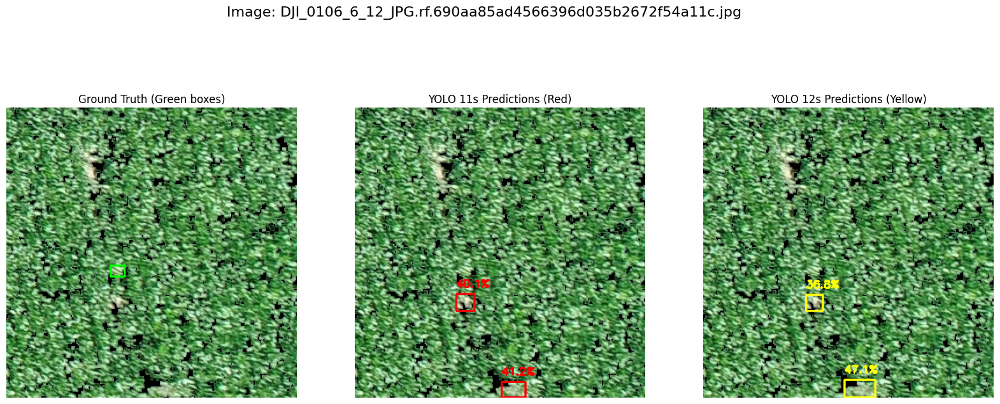


image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0103_6_12_JPG.rf.3d1c817f0e6684d68b343f568429f407.jpg: 416x416 3 weeds, 6.9ms
Speed: 0.9ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0103_6_12_JPG.rf.3d1c817f0e6684d68b343f568429f407.jpg: 640x640 4 weeds, 21.1ms
Speed: 2.2ms preprocess, 21.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0025_7_2_JPG.rf.41f7ce144d5fdc6adcf9e29f28675195.jpg: 640x640 1 weed, 21.1ms
Speed: 2.5ms preprocess, 21.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


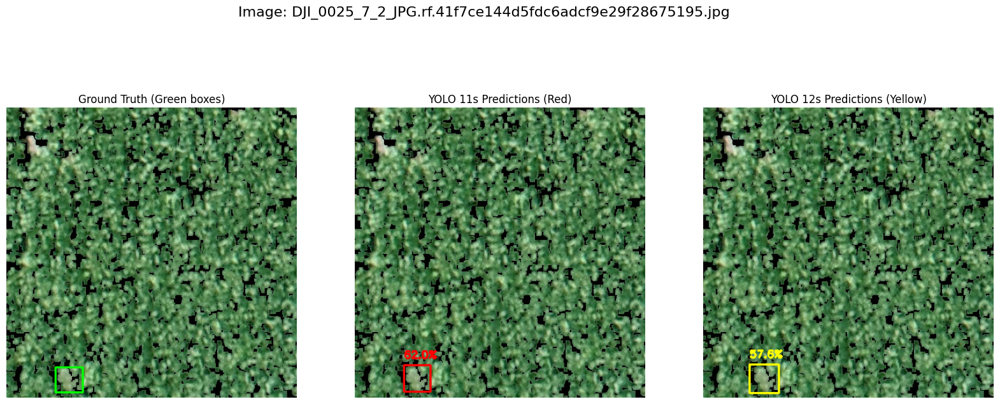


image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0052_7_6_JPG.rf.98a4f833605f57352a7837ceaa548aff.jpg: 416x416 (no detections), 7.2ms
Speed: 0.9ms preprocess, 7.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0052_7_6_JPG.rf.98a4f833605f57352a7837ceaa548aff.jpg: 640x640 2 weeds, 21.0ms
Speed: 2.2ms preprocess, 21.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


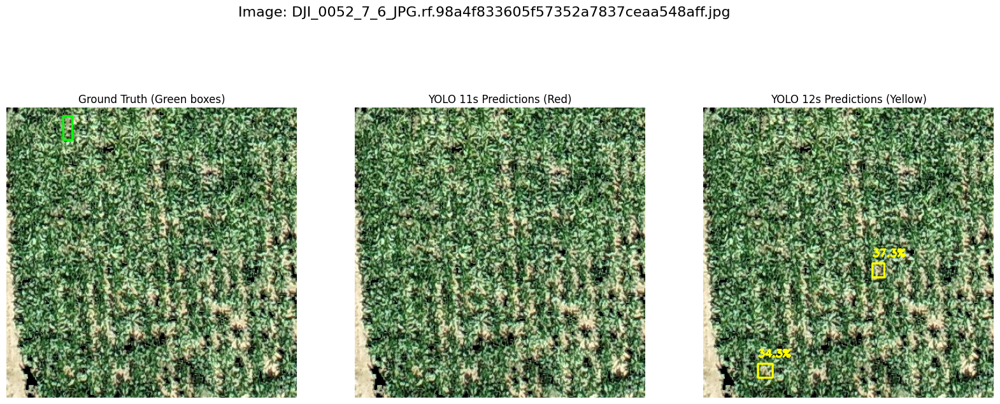


Speed: 1.0ms preprocess, 11.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0080_6_4_JPG.rf.1cab2135a11a9a63d5a94f8225016eab.jpg: 640x640 (no detections), 21.1ms
Speed: 2.9ms preprocess, 21.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


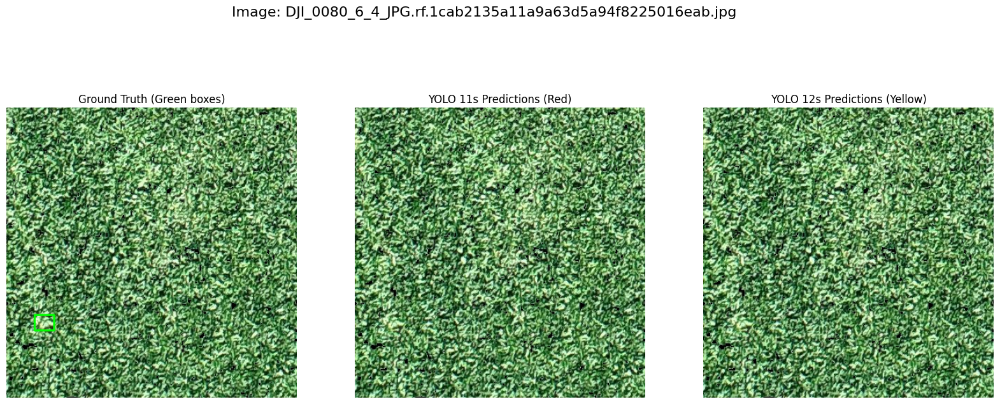


image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0028_4_4_JPG.rf.9515da7791e2167e0e55a4262d041c34.jpg: 416x416 1 weed, 6.7ms
Speed: 0.9ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0028_4_4_JPG.rf.9515da7791e2167e0e55a4262d041c34.jpg: 640x640 1 weed, 21.1ms
Speed: 2.4ms preprocess, 21.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


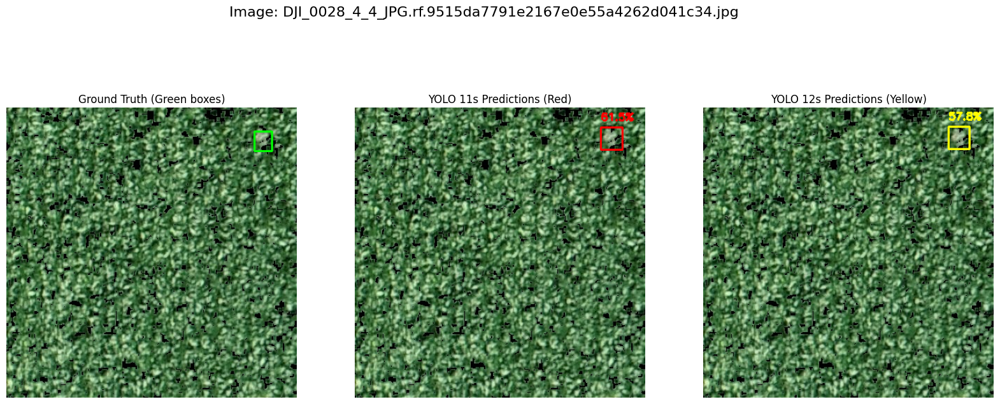


image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0105_3_6_JPG.rf.8097b4b33549a950b5107dc35fcde021.jpg: 416x416 (no detections), 7.7ms
Speed: 0.9ms preprocess, 7.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0105_3_6_JPG.rf.8097b4b33549a950b5107dc35fcde021.jpg: 640x640 (no detections), 21.0ms
Speed: 2.1ms preprocess, 21.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


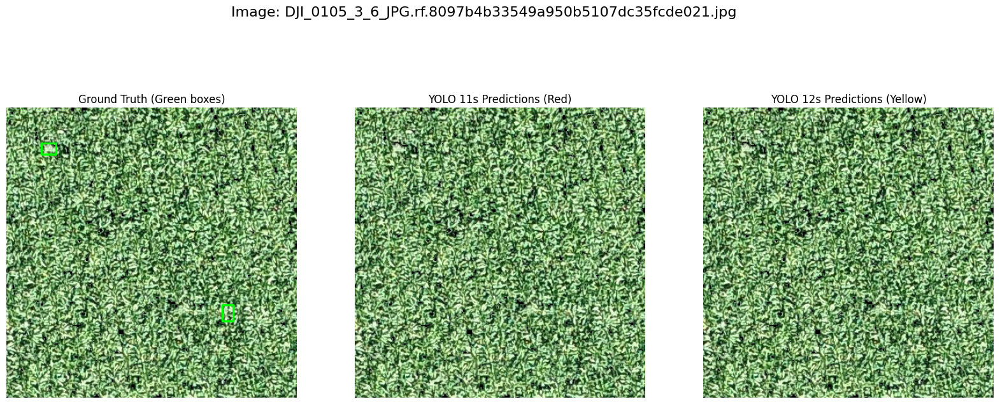


image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0083_3_3_JPG.rf.02694dcdaa0ac054b9b9a2e6f8dfe50e.jpg: 416x416 (no detections), 6.6ms
Speed: 0.9ms preprocess, 6.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0083_3_3_JPG.rf.02694dcdaa0ac054b9b9a2e6f8dfe50e.jpg: 640x640 (no detections), 21.0ms
Speed: 2.1ms preprocess, 21.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


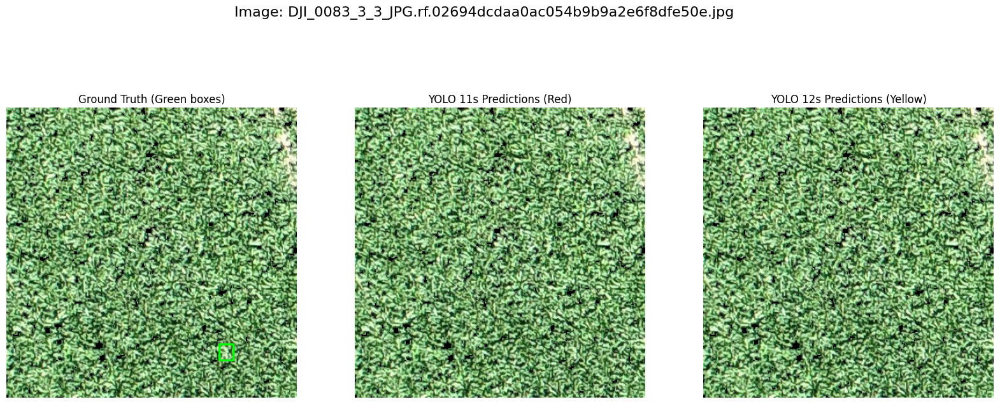


image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0048_0_8_JPG.rf.052f417761547e542ac9004297a2e1e6.jpg: 416x416 2 weeds, 6.6ms
Speed: 0.9ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0048_0_8_JPG.rf.052f417761547e542ac9004297a2e1e6.jpg: 640x640 1 weed, 21.0ms
Speed: 2.1ms preprocess, 21.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


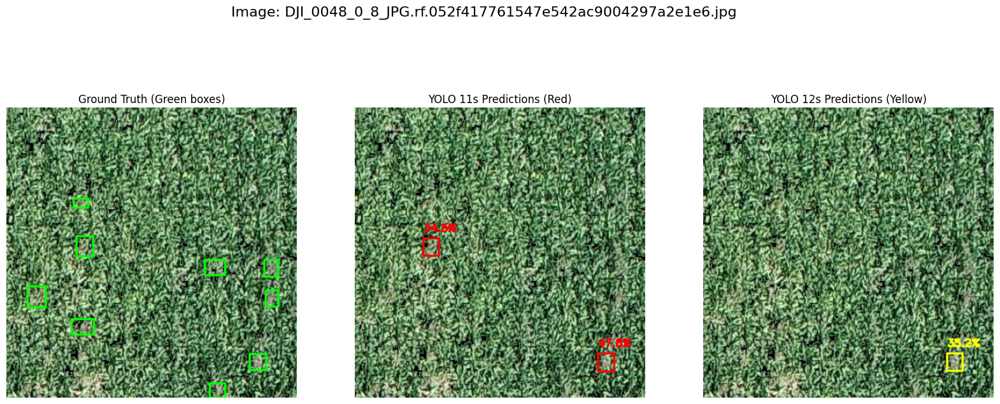


image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0087_6_5_JPG.rf.0d170e52831c7426dfe1f2ab716b5453.jpg: 416x416 2 weeds, 6.9ms
Speed: 0.9ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0087_6_5_JPG.rf.0d170e52831c7426dfe1f2ab716b5453.jpg: 640x640 2 weeds, 21.0ms
Speed: 2.2ms preprocess, 21.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


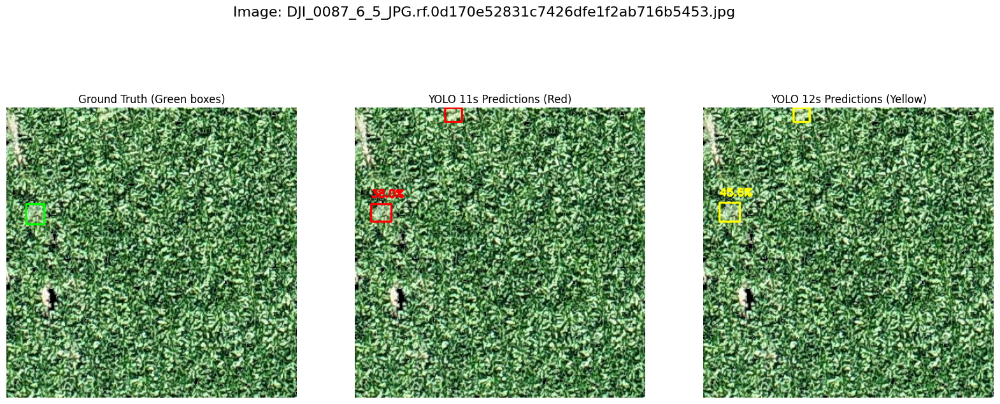


image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0034_5_0_JPG.rf.fddf5b4c4b90e997d22c0c618e379b98.jpg: 416x416 2 weeds, 6.9ms
Speed: 1.0ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0034_5_0_JPG.rf.fddf5b4c4b90e997d22c0c618e379b98.jpg: 640x640 2 weeds, 21.0ms
Speed: 2.1ms preprocess, 21.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


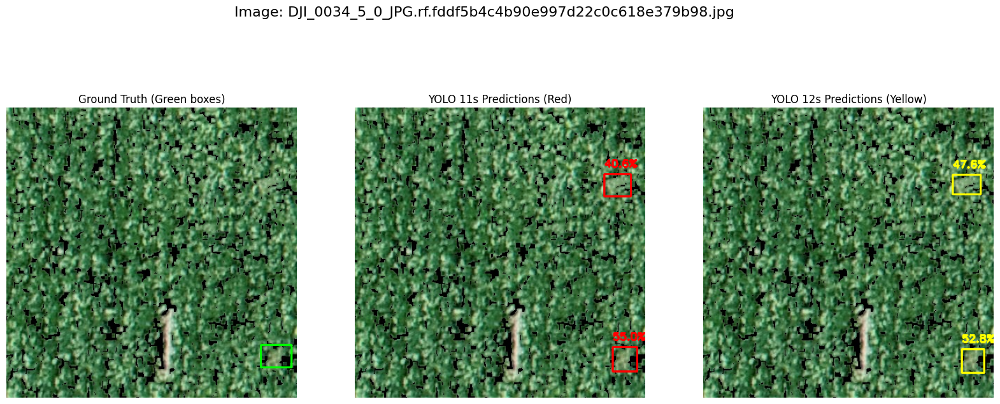


image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0060_4_12_JPG.rf.53b1137d377a1163b7a7c2f3dbeb96e0.jpg: 416x416 (no detections), 7.3ms
Speed: 0.9ms preprocess, 7.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0060_4_12_JPG.rf.53b1137d377a1163b7a7c2f3dbeb96e0.jpg: 640x640 (no detections), 21.1ms
Speed: 2.3ms preprocess, 21.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


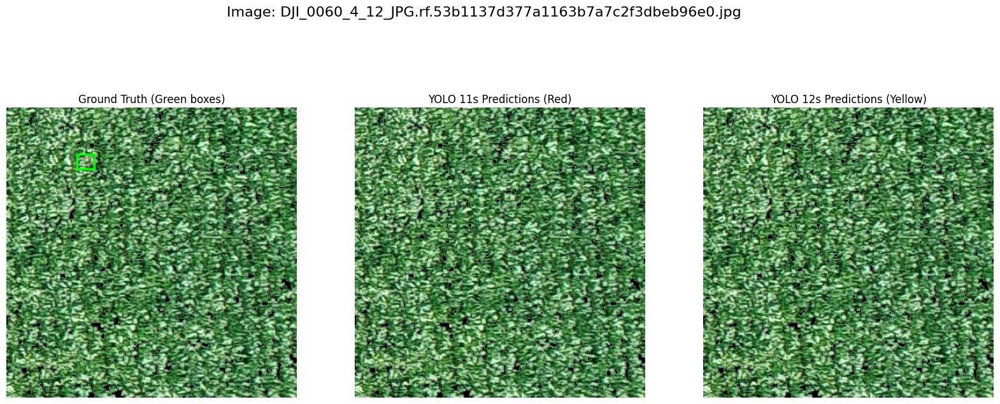


image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0011_4_3_JPG.rf.0e12a10e9ae807005772316a5aca0766.jpg: 416x416 1 weed, 6.8ms
Speed: 0.9ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0011_4_3_JPG.rf.0e12a10e9ae807005772316a5aca0766.jpg: 640x640 1 weed, 21.1ms
Speed: 2.2ms preprocess, 21.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


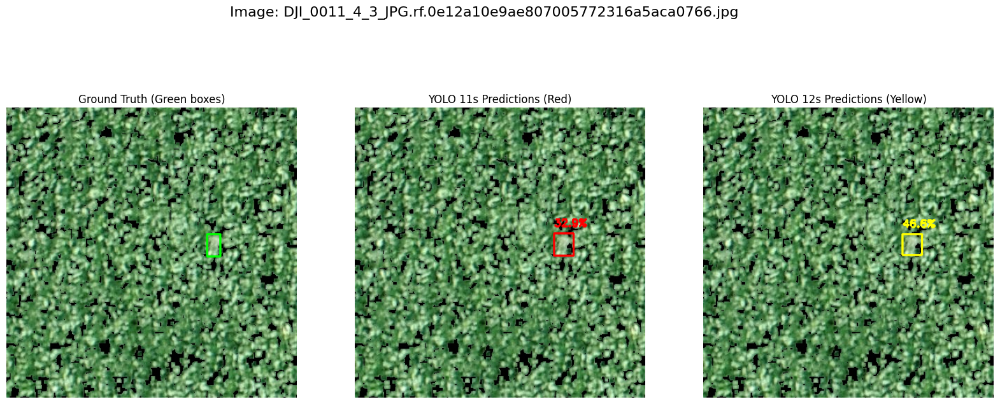


image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0098_2_5_JPG.rf.a6fe0f2c2a9a6f0f7764727a7a2983e6.jpg: 416x416 1 weed, 7.0ms
Speed: 1.0ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0098_2_5_JPG.rf.a6fe0f2c2a9a6f0f7764727a7a2983e6.jpg: 640x640 1 weed, 21.1ms
Speed: 2.4ms preprocess, 21.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


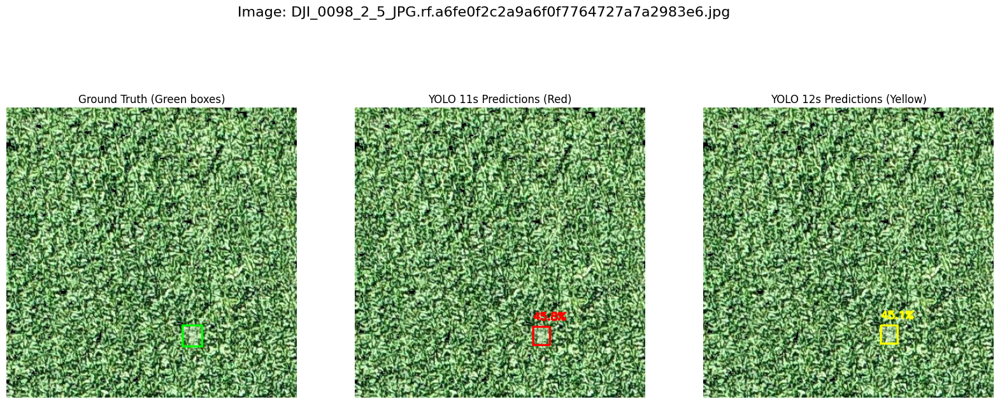


image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0094_5_5_JPG.rf.f998ebbcd1c7b7f644d552e113a6fdca.jpg: 416x416 2 weeds, 7.1ms
Speed: 0.9ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0094_5_5_JPG.rf.f998ebbcd1c7b7f644d552e113a6fdca.jpg: 640x640 1 weed, 21.1ms
Speed: 2.2ms preprocess, 21.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


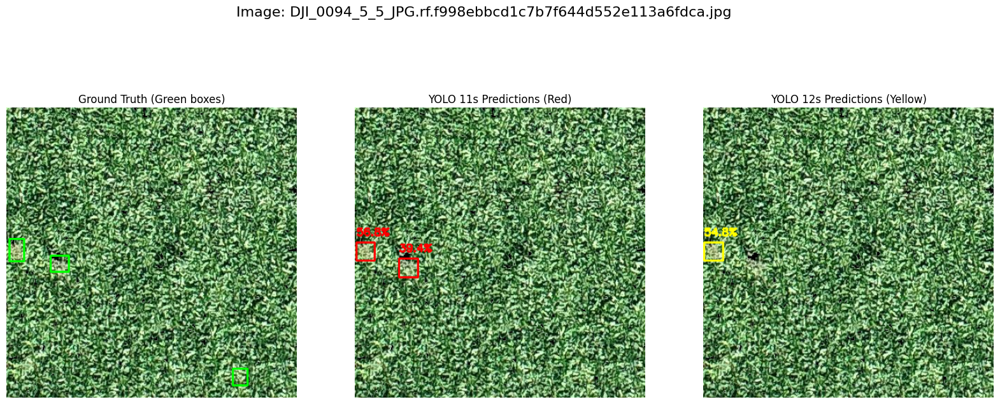


image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0016_5_1_JPG.rf.85b12e578c93a27b06d3b87a5f546662.jpg: 416x416 1 weed, 6.8ms
Speed: 0.9ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/working/weed-dataset/test/images/DJI_0016_5_1_JPG.rf.85b12e578c93a27b06d3b87a5f546662.jpg: 640x640 1 weed, 21.1ms
Speed: 2.1ms preprocess, 21.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


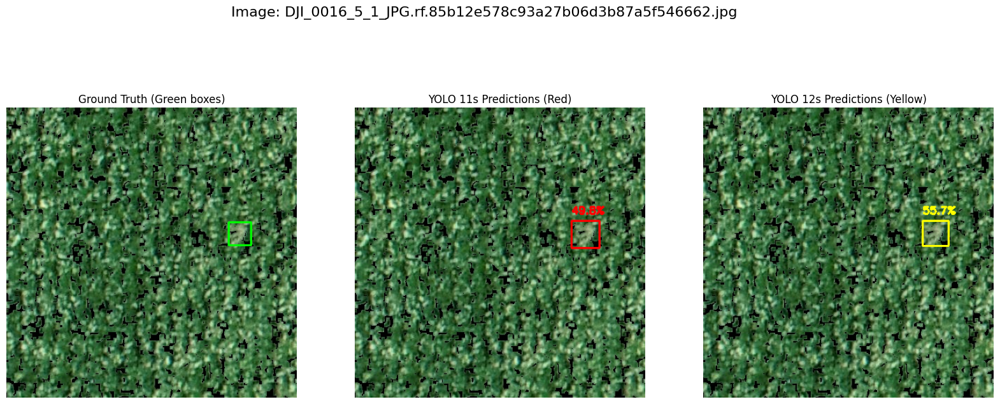

In [95]:
def load_ground_truth(label_path, image_shape):
    """
    Loads YOLO-format ground truth annotations and converts them to absolute coordinates.
    """
    gt_boxes = []
    if not os.path.exists(label_path):
        return gt_boxes
    with open(label_path, 'r') as f:
        lines = f.readlines()
    h, w = image_shape[:2]
    for line in lines:
        parts = line.strip().split()
        if len(parts) != 5:
            continue
        class_id, x_center, y_center, bbox_w, bbox_h = map(float, parts)
        xmin = int((x_center - bbox_w / 2) * w)
        ymin = int((y_center - bbox_h / 2) * h)
        xmax = int((x_center + bbox_w / 2) * w)
        ymax = int((y_center + bbox_h / 2) * h)
        gt_boxes.append(((xmin, ymin, xmax, ymax), int(class_id)))
    return gt_boxes

TEST_IMG_DIR = TEST_IMG_OUT     
TEST_LABEL_DIR = TEST_LABELS_OUT  

random.seed(41)
test_images = glob.glob(os.path.join(TEST_IMG_DIR, '*.*'))
selected_images = random.sample(test_images, 30)

for img_path in selected_images:
    image = cv2.imread(img_path)
    if image is None:
        continue

    pred_11s = image.copy()
    pred_12s = image.copy()
    gt_image = image.copy()

    # YOLO 11s Predictions
    results_11s = finetune_model_11s_smallweedcrops.predict(source=img_path, conf=0.30)
    if len(results_11s[0].boxes) > 0:
        boxes_11s = results_11s[0].boxes.xyxy.cpu().numpy()
        confs_11s = results_11s[0].boxes.conf.cpu().numpy()
        for box, conf in zip(boxes_11s, confs_11s):
            x1, y1, x2, y2 = map(int, box)
            cv2.rectangle(pred_11s, (x1, y1), (x2, y2), (0, 0, 255), 2)  # Red for 11s
            cv2.putText(pred_11s, f"{conf * 100:.1f}%", (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)

    # YOLO 12s Predictions
    results_12s = finetune_model_12s.predict(source=img_path, conf=0.30)
    if len(results_12s[0].boxes) > 0:
        boxes_12s = results_12s[0].boxes.xyxy.cpu().numpy()
        confs_12s = results_12s[0].boxes.conf.cpu().numpy()
        for box, conf in zip(boxes_12s, confs_12s):
            x1, y1, x2, y2 = map(int, box)
            cv2.rectangle(pred_12s, (x1, y1), (x2, y2), (0, 255, 255), 2) 
            cv2.putText(pred_12s, f"{conf * 100:.1f}%", (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 255), 2)

    # Load Ground Truth
    base_filename = os.path.splitext(os.path.basename(img_path))[0]
    label_path = os.path.join(TEST_LABEL_DIR, base_filename + ".txt")
    gt_boxes = load_ground_truth(label_path, image.shape)
    for (box_coords, class_id) in gt_boxes:
        x1, y1, x2, y2 = box_coords
        cv2.rectangle(gt_image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for ground truth

    pred_11s_rgb = cv2.cvtColor(pred_11s, cv2.COLOR_BGR2RGB)
    pred_12s_rgb = cv2.cvtColor(pred_12s, cv2.COLOR_BGR2RGB)
    gt_image_rgb = cv2.cvtColor(gt_image, cv2.COLOR_BGR2RGB)

    fig, axs = plt.subplots(1, 3, figsize=(20, 8))
    axs[0].imshow(gt_image_rgb)
    axs[0].set_title("Ground Truth (Green boxes)")
    axs[0].axis("off")

    axs[1].imshow(pred_11s_rgb)
    axs[1].set_title("YOLO 11s Predictions (Red)")
    axs[1].axis("off")

    axs[2].imshow(pred_12s_rgb)
    axs[2].set_title("YOLO 12s Predictions (Yellow)")
    axs[2].axis("off")

    plt.suptitle(f"Image: {os.path.basename(img_path)}", fontsize=16)
    plt.show()


In [ ]:
# from IPython.display import display
# from PIL import Image

# image_path = "/kaggle/working/runs/detect/train/confusion_matrix_normalized.png"
# img = Image.open(image_path)
# display(img)

In [ ]:
import shutil

# 'extracted_images_folder' is the directory where your processed images are saved
output_zip = 'extracted_images_folder'
shutil.make_archive(output_zip, 'zip', '/kaggle/working/weed-dataset')


In [54]:
import shutil

# shutil.rmtree("/kaggle/working/runs/detect/val2", ignore_errors=True)
# shutil.rmtree("/kaggle/working/runs/detect/train3", ignore_errors=True)


In [ ]:
ls /kaggle/working/runs/detect/train